In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.7/914.7 kB 13.8 MB/s eta 0:00:00a 0:00:01


In [5]:
import cv2
from ultralytics import YOLO
import wandb

import torch
import glob
import os
import matplotlib.pyplot as plt


In [3]:
model = YOLO('/kaggle/input/cv-rtuitlab/yolo11s.pt')

In [4]:
# Обучение модели YOLO на заданном наборе данных с использованием указанных параметров
results = model.train(
    data="/kaggle/input/cv-rtuitlab/data.yaml",  # Путь к файлу с конфигурацией данных в формате YAML
    epochs=30,  # Количество эпох обучения 
    batch=32,  # Размер пакета (batch size) для обучения
    augment=True,  # Включение аугментации данных для увеличения разнообразия обучающего набора
    fliplr=0.5,  # Вертикальное (горизонтальное) отражение изображений с вероятностью 50%
    scale=0.5,  # Применение случайного масштабирования изображений до 50%
    translate=0.1,  # Случайный сдвиг изображений до 10% от их размера
    mixup=0.2,  # Вероятность применения смешивания изображений (mixup) на уровне 20%
    mosaic=0.5,  # Вероятность применения мозаичной аугментации изображений (mosaic) на уровне 50%
    hsv_h=0.1,  # Случайное изменение оттенка (hue) в пределах 10%
    hsv_s=0.7,  # Случайное изменение насыщенности (saturation) в пределах 70%
    hsv_v=0.4,  # Случайное изменение яркости (value) в пределах 40%
    close_mosaic=5,  # Максимальное количество близких объектов для применения мозаики
    dropout=0.05,  # Вероятность отключения (dropout) нейронов в 5% случаев во время обучения
    plots=True,  # Включение отображения графиков обучения и валидации
    device=[0]  # Использование GPU 0 и 1 для ускорения обучения
)

Ultralytics 8.3.74 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/input/cv-rtuitlab/yolo11s.pt, data=/kaggle/input/cv-rtuitlab/data.yaml, epochs=20, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=[0], workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=5, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.05, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False,

100%|██████████| 755k/755k [00:00<00:00, 17.6MB/s]


Overriding model.yaml nc=80 with nc=27

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 77.3MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/cv-rtuitlab/train_zip/train/labels... 114 images, 0 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<00:00, 242.05it/s]

train: WARNING ⚠️ Cache directory /kaggle/input/cv-rtuitlab/train_zip/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.3 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/input/cv-rtuitlab/test_zip/test/labels... 53 images, 0 backgrounds, 0 corrupt: 100%|██████████| 53/53 [00:00<00:00, 201.82it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/cv-rtuitlab/test_zip/test is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000323, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20       9.2G      1.966      5.479      1.697        247        640: 100%|██████████| 4/4 [00:03<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]

                   all         53        335      0.226     0.0149    0.00426    0.00286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      9.22G      1.905       5.39      1.692        271        640: 100%|██████████| 4/4 [00:02<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

                   all         53        335      0.413     0.0118    0.00531    0.00341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      9.26G      1.774      5.116      1.574        234        640: 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]

                   all         53        335    0.00928      0.218     0.0165     0.0111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      9.22G      1.492      4.398      1.402        173        640: 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

                   all         53        335      0.452     0.0413     0.0582     0.0406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      9.24G      1.442      3.842      1.319        216        640: 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

                   all         53        335      0.748     0.0817      0.117     0.0838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      9.19G      1.382      3.237      1.245        204        640: 100%|██████████| 4/4 [00:02<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]

                   all         53        335      0.689      0.151      0.187      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20       9.2G       1.25       2.73      1.201        159        640: 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

                   all         53        335      0.684      0.235      0.287      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      9.21G      1.269      2.443      1.204        245        640: 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

                   all         53        335      0.603      0.348      0.384      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      9.23G      1.212      2.197      1.175        215        640: 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

                   all         53        335      0.805      0.386      0.475      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      9.19G      1.217      2.048       1.19        176        640: 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

                   all         53        335       0.77      0.478      0.526      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      9.24G      1.161      1.751      1.118        184        640: 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

                   all         53        335      0.756      0.507      0.584      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      9.24G      1.139      1.686      1.127        151        640: 100%|██████████| 4/4 [00:02<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

                   all         53        335      0.709      0.562      0.644      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      9.21G      1.093      1.405       1.08        229        640: 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all         53        335      0.689       0.67       0.69       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      9.24G      1.045      1.367      1.065        238        640: 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         53        335      0.768      0.644      0.738      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      9.23G      1.063      1.451      1.068        152        640: 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         53        335      0.711      0.726      0.762      0.516


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      9.18G     0.9714      1.347      1.016        108        640: 100%|██████████| 4/4 [00:03<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

                   all         53        335      0.769      0.718      0.769      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      9.17G     0.9576      1.271      1.008        120        640: 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         53        335      0.824      0.725      0.785      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      9.17G     0.9641      1.276      1.001         96        640: 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         53        335      0.846      0.722      0.804      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      9.11G     0.9555      1.191      1.001        123        640: 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         53        335      0.831      0.763      0.817      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      9.11G     0.9303      1.186     0.9929         86        640: 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         53        335      0.822      0.769      0.822      0.571



20 epochs completed in 0.027 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 19.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.74 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11s summary (fused): 238 layers, 9,423,249 parameters, 0 gradients, 21.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


                   all         53        335      0.883      0.724      0.837      0.573
 MCC_SD card connector         12         12          1      0.724      0.932      0.678
          Piezo Buzzer         10         10          1      0.423      0.686      0.414
     LCD display place         13         13          1       0.69      0.949       0.63
                  LEDs         13         13      0.918      0.867      0.954      0.683
          Push Buttons         13         13      0.767      0.923      0.964      0.756
    GLCD Display Place         21         24      0.836      0.848      0.901       0.58
     microBoard socket         13         13      0.925      0.944      0.979      0.734
               Jumpers         13         13      0.837      0.793      0.901      0.663
       Platamicroboard          9          9      0.746          1      0.897      0.772
                 Ports         18         18       0.81      0.833      0.876      0.628
              DebugUS

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 11.7ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to runs/detect/train



0: 480x640 1 microBoard socket, 1 DisplayEasyTFT, 1 Processor, 11.9ms
Speed: 2.7ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


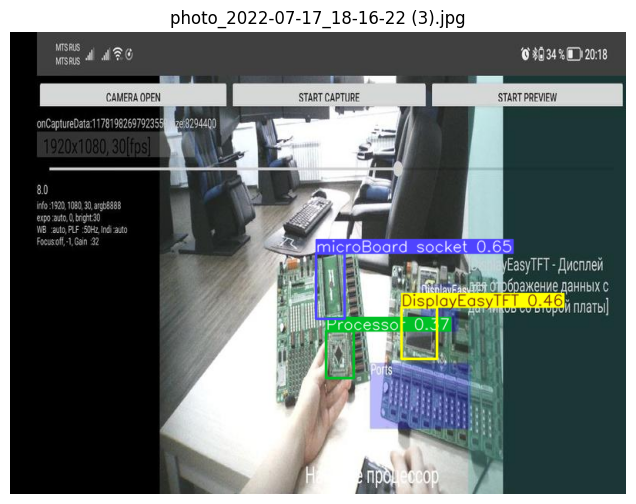


0: 480x640 1 MCC_SD card connector, 2 LCD display places, 1 LEDs, 1 Push Buttons, 1 GLCD Display Place, 1 Jumpers, 1 Platamicroboard, 9.9ms
Speed: 2.4ms preprocess, 9.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


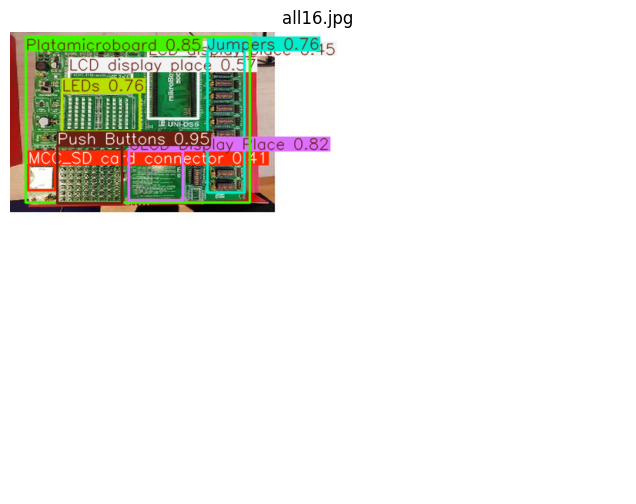


0: 480x640 (no detections), 9.7ms
Speed: 2.6ms preprocess, 9.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)


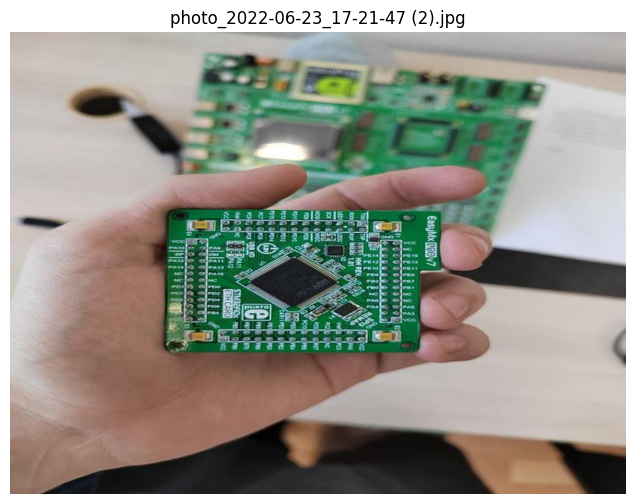


0: 640x480 1 microBoard socket, 10.1ms
Speed: 2.6ms preprocess, 10.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


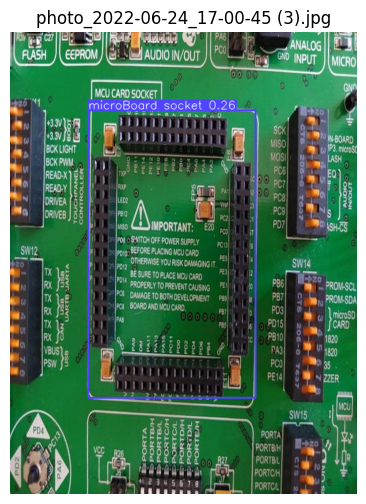


0: 480x640 (no detections), 9.7ms
Speed: 2.7ms preprocess, 9.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


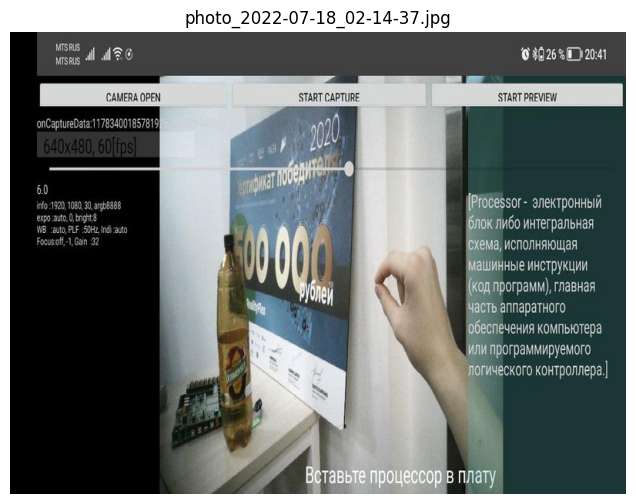


0: 480x640 1 Ports, 1 DebugUSB, 1 Buzzer, 1 DisplayEasyTFT, 1 Processor, 1 ButtonPressLevel, 1 Joystick, 1 PlataGreenWithProcessor, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


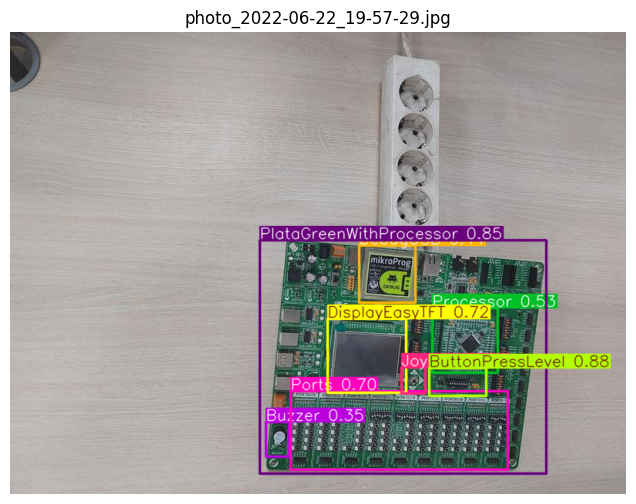


0: 480x640 1 ProcessorPlace, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


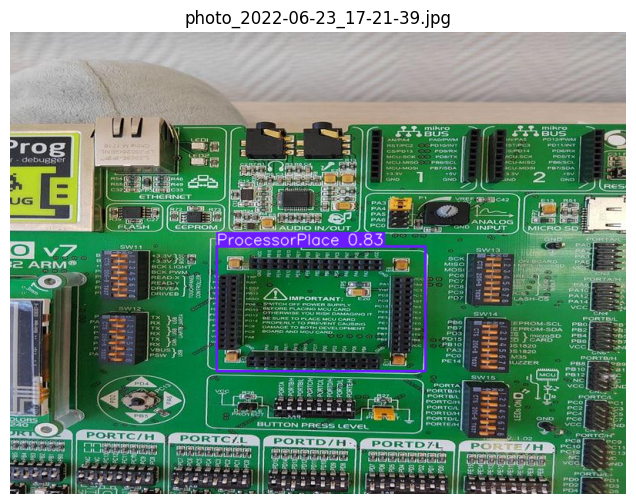


0: 480x640 1 Ports, 1 DebugUSB, 1 DisplayEasyTFT, 1 Processor, 1 ButtonPressLevel, 1 Joystick, 1 PlataGreenWithProcessor, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


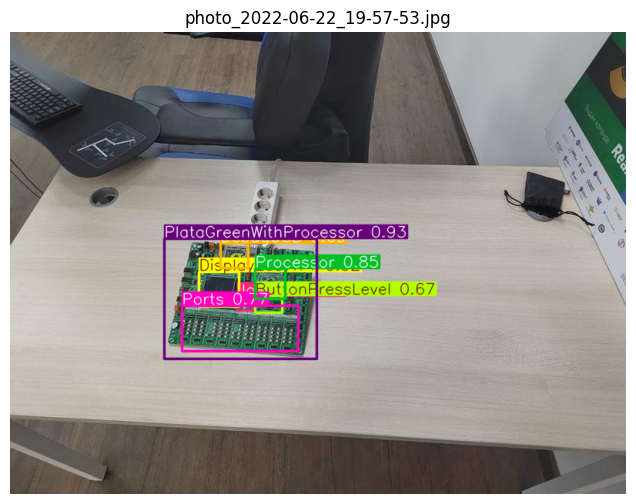


0: 640x544 2 GLCD Display Places, 1 PlataOrange, 1 DebugBlue, 1 PortsBlueOrange, 10.8ms
Speed: 2.1ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 544)


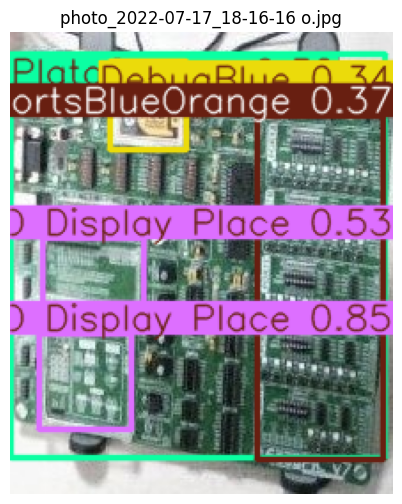


0: 480x640 1 GLCD Display Place, 2 PlataBlues, 1 DisplayBlue, 1 PortsBlueOrange, 2 Digits, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


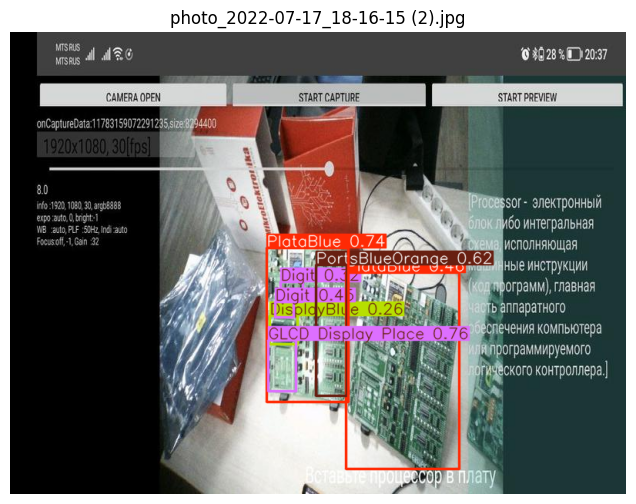


0: 480x640 1 Jumpers, 1 DisplayEasyTFT, 1 Processor, 9.5ms
Speed: 3.1ms preprocess, 9.5ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


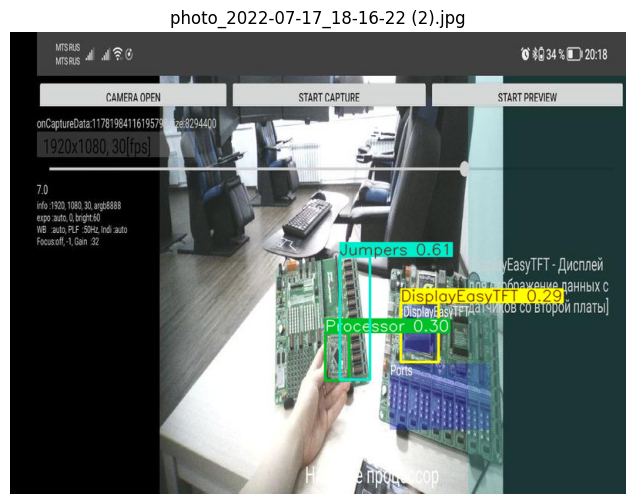


0: 480x640 1 Ports, 1 DisplayEasyTFT, 1 PlataGreenWithoutProcessor, 9.3ms
Speed: 2.8ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


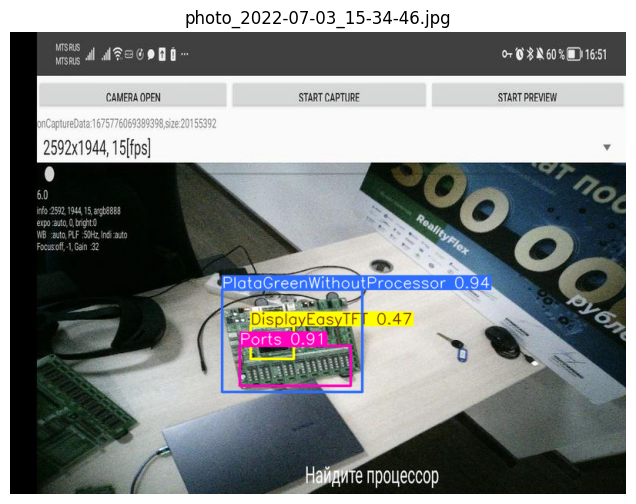


0: 480x640 1 ProcessorPlace, 9.3ms
Speed: 3.0ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


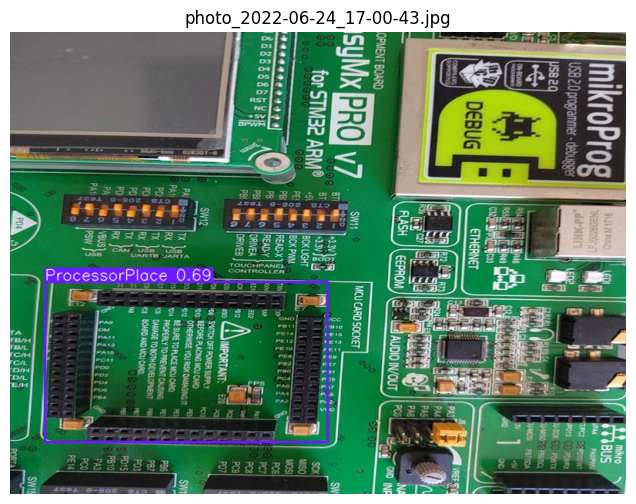


0: 480x640 (no detections), 9.4ms
Speed: 2.8ms preprocess, 9.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


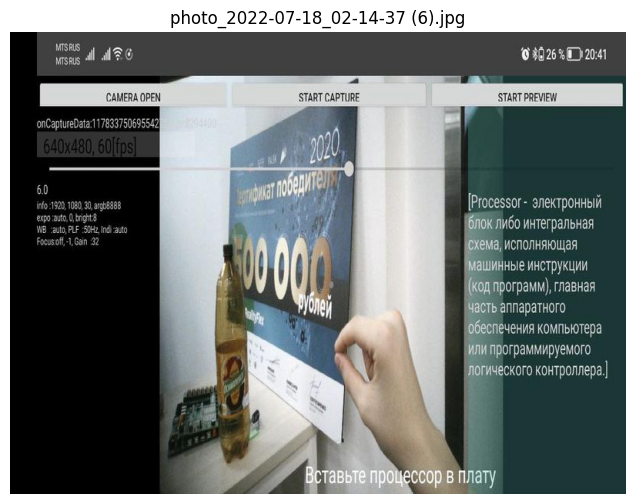


0: 480x640 1 MCC_SD card connector, 1 LCD display place, 1 LEDs, 1 Push Buttons, 1 GLCD Display Place, 1 microBoard socket, 1 Jumpers, 1 Platamicroboard, 9.5ms
Speed: 2.4ms preprocess, 9.5ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


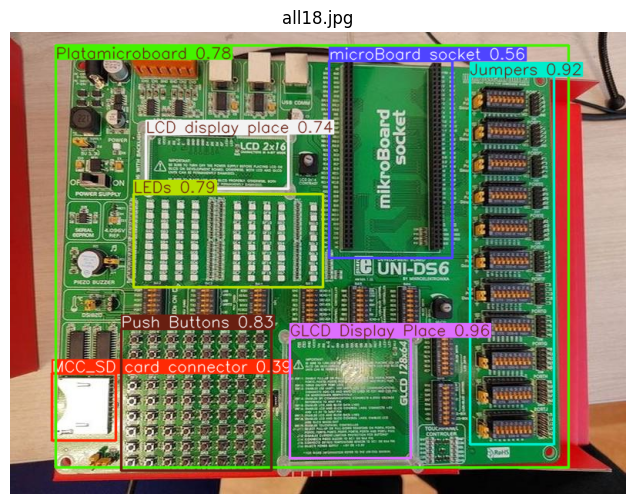


0: 480x640 1 ProcessorPlace, 9.3ms
Speed: 2.5ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


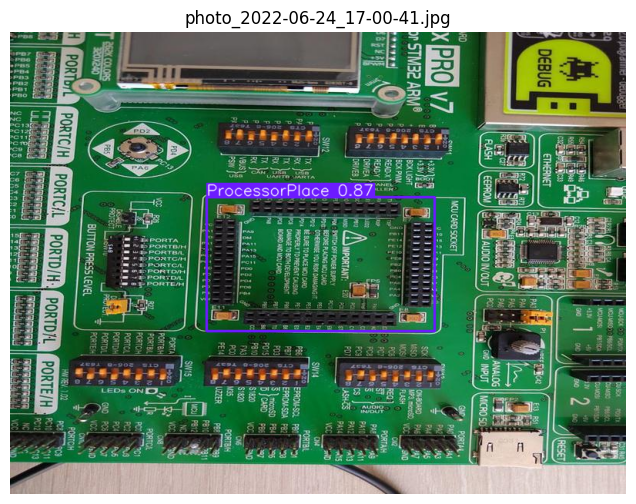


0: 480x640 1 Piezo Buzzer, 1 LCD display place, 1 LEDs, 1 Push Buttons, 2 GLCD Display Places, 1 microBoard socket, 1 Jumpers, 1 Platamicroboard, 1 DisplayEasyTFT, 9.8ms
Speed: 2.7ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


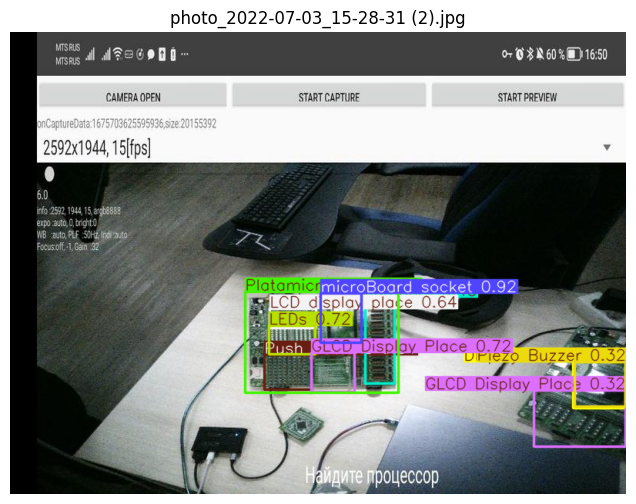


0: 480x640 1 Ports, 1 DebugUSB, 1 Buzzer, 1 DisplayEasyTFT, 1 ButtonPressLevel, 1 Joystick, 1 PlataGreenWithProcessor, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


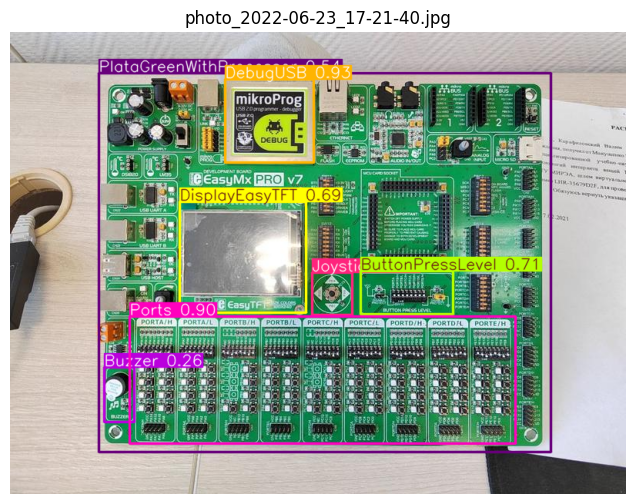


0: 480x640 1 Push Buttons, 9.6ms
Speed: 2.6ms preprocess, 9.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


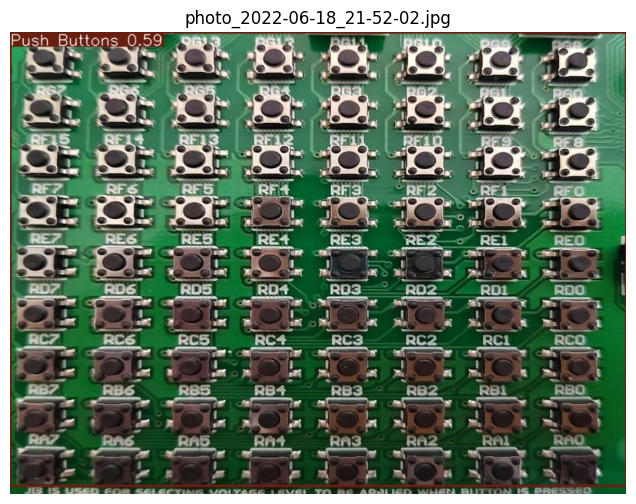


0: 480x640 (no detections), 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


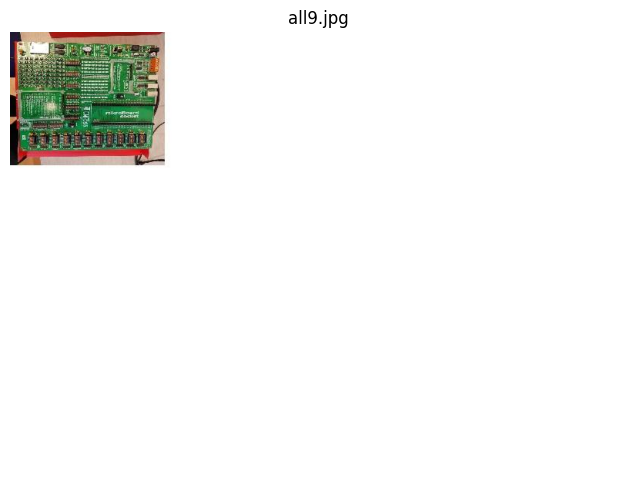

In [7]:
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')  # Проверь путь

# Папка с изображениями
image_folder = "/kaggle/input/cv-rtuitlab/test_zip/test/images"  # Укажи правильный путь

# Получение списка всех изображений в папке
image_paths = glob.glob(os.path.join(image_folder, "*.jpg"))[:20]  # Берем 20 изображений

# Обработка изображений
for img_path in image_paths:
    # Загрузка изображения
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV использует BGR, переводим в RGB
    
    # Получение предсказаний
    results = model(img)
    
    # Визуализация предсказаний
    for result in results:
        img_with_boxes = result.plot()  # Накладываем боксы
    
    # Отображение изображения в отдельном окне Matplotlib
    plt.figure(figsize=(8, 6))
    plt.imshow(img_with_boxes)
    plt.axis("off")  # Убираем оси
    plt.title(os.path.basename(img_path))  # Заголовок — имя файла
    plt.show()

In [8]:
from ultralytics import YOLO, checks, hub
checks()

hub.login('2c54583e16d05809767c9501b6f6f06671ba9fbf09')

model = YOLO('https://hub.ultralytics.com/models/dZ5tq32Mvf6XxFQtwjb8')
results = model.train()

Ultralytics 8.3.74 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6133.1/8062.4 GB disk)
requirements: Ultralytics requirement ['hub-sdk>=0.0.12'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.9/42.9 kB 2.8 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 3.8s, installed 1 package: ['hub-sdk>=0.0.12']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

Ultralytics HUB: New authentication successful ✅
Ultralytics HUB: View model at https://hub.ultralytics.com/models/dZ5tq32Mvf6XxFQtwjb8 🚀


100%|██████████| 54.5M/54.5M [00:02<00:00, 24.3MB/s]


Ultralytics 8.3.74 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=weights/epoch-50.pt, data=https://storage.googleapis.com/ultralytics-hub.appspot.com/users/MWwrkEF0tfcIJyh7jaKWEC0E75L2/datasets/Ra8t8IgRrKufrNew9Whc/archive (1).zip, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=None, device=None, workers=0, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=weights/epoch-50.pt, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_ma

100%|██████████| 33.6M/33.6M [00:01<00:00, 17.7MB/s]
Unzipping archive (1).zip to /kaggle/working/datasets/archive (1)...: 100%|██████████| 337/337 [00:00<00:00, 1110.37file/s]

TensorBoard: Start with 'tensorboard --logdir runs/detect/train', view at http://localhost:6006/

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]  

 10                  -1  1    990976  ultralytics.nn.modules.block.C2PSA           [512, 512, 1]                 
 11                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 12             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 13                  -1  1    443776  ultralytics.nn.modules.block.C3k2            [768, 256, 1, False]          
 14                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 15             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 16                  -1  1    127680  ultralytics.nn.modules.block.C3k2            [512, 128, 1, False]          
 17                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
 18            [-1, 13]  1         0  ultralytics.nn.modules.conv.Concat           [1]  

train: Scanning /kaggle/working/datasets/archive (1)/train_zip/train/labels... 114 images, 0 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<00:00, 930.98it/s]

train: New cache created: /kaggle/working/datasets/archive (1)/train_zip/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/datasets/archive (1)/test_zip/test/labels... 53 images, 0 backgrounds, 0 corrupt: 100%|██████████| 53/53 [00:00<00:00, 986.33it/s]

val: New cache created: /kaggle/working/datasets/archive (1)/test_zip/test/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000323, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Resuming training weights/epoch-50.pt from epoch 52 to 100 total epochs
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.97G     0.6847     0.4945     0.9189         35        640: 100%|██████████| 8/8 [00:04<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         53        335      0.911      0.912      0.935      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.85G     0.7329     0.5585     0.9174         38        640: 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

                   all         53        335      0.811      0.893      0.866      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.69G     0.7094     0.6168     0.9206         21        640: 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         53        335      0.821      0.891      0.881      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.68G      0.737     0.5582     0.9285         47        640: 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         53        335      0.877      0.895      0.917       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.63G     0.7147     0.5455     0.9379         13        640: 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.93it/s]

                   all         53        335      0.913      0.897      0.918      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.69G      0.706     0.4945       0.93         14        640: 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         53        335      0.917      0.911      0.936      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.71G     0.6754     0.4749     0.9035         33        640: 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.92it/s]

                   all         53        335       0.92      0.928      0.947      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.71G     0.6742     0.4569      0.914         28        640: 100%|██████████| 8/8 [00:03<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         53        335      0.919      0.914      0.938      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100       4.7G     0.7034     0.5009      0.921         19        640: 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         53        335      0.911      0.917      0.937      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.69G     0.6271     0.4486     0.9194          7        640: 100%|██████████| 8/8 [00:03<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         53        335      0.903      0.917      0.936      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.66G     0.7122     0.4877     0.9288         32        640: 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         53        335      0.864      0.945      0.937       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100       4.7G     0.6686     0.4757      0.911         27        640: 100%|██████████| 8/8 [00:03<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         53        335      0.882      0.926      0.936      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100       4.7G      0.685     0.5452     0.9361          9        640: 100%|██████████| 8/8 [00:03<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.92it/s]

                   all         53        335      0.914      0.885      0.935      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.66G      0.676     0.4577     0.9054         30        640: 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.01it/s]

                   all         53        335      0.891      0.886      0.921      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100       4.7G     0.6907     0.4332     0.9157         30        640: 100%|██████████| 8/8 [00:03<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.05it/s]

                   all         53        335       0.91      0.886      0.932      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.68G     0.6378     0.4371     0.8949         27        640: 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         53        335       0.91      0.889      0.936      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.63G     0.6286     0.4467     0.8903         15        640: 100%|██████████| 8/8 [00:03<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         53        335      0.914       0.89      0.933      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.68G     0.6422     0.4356     0.8894         38        640: 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.87it/s]

                   all         53        335      0.885      0.911      0.935       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.66G     0.6146     0.4602     0.9032         18        640: 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         53        335      0.901      0.898      0.941      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.69G     0.6237     0.4404     0.8903         17        640: 100%|██████████| 8/8 [00:03<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         53        335      0.881      0.921       0.94      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.68G     0.6343     0.4314      0.895          9        640: 100%|██████████| 8/8 [00:03<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         53        335      0.883      0.923      0.939      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.63G     0.6104     0.4343     0.8861         29        640: 100%|██████████| 8/8 [00:03<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         53        335      0.888      0.925       0.94      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.67G       0.66     0.4335     0.8925         23        640: 100%|██████████| 8/8 [00:03<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         53        335      0.918      0.901      0.937      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.68G      0.665     0.4604     0.9054         11        640: 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.03it/s]

                   all         53        335      0.895      0.928      0.932      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      4.69G     0.6397     0.4404     0.9207         17        640: 100%|██████████| 8/8 [00:03<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

                   all         53        335      0.915      0.903       0.93      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.67G     0.5956     0.4005     0.8696         23        640: 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         53        335      0.906      0.917      0.936      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.65G     0.5928     0.4201      0.893         20        640: 100%|██████████| 8/8 [00:03<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         53        335      0.904      0.916       0.94      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100       4.7G     0.6226     0.4404     0.8768         45        640: 100%|██████████| 8/8 [00:03<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         53        335      0.901      0.921      0.939      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      4.65G      0.609     0.4154      0.882         15        640: 100%|██████████| 8/8 [00:03<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         53        335      0.908      0.919      0.936      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.65G       0.68     0.4223     0.9214         14        640: 100%|██████████| 8/8 [00:03<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         53        335      0.911      0.909      0.934      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      4.67G     0.6117      0.423     0.8757         25        640: 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.03it/s]

                   all         53        335      0.925        0.9      0.939      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100       4.7G     0.6219     0.3912     0.8944         20        640: 100%|██████████| 8/8 [00:03<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         53        335      0.919      0.898      0.934      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      4.69G     0.6055     0.4064     0.8862         40        640: 100%|██████████| 8/8 [00:03<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.02it/s]

                   all         53        335      0.905      0.915      0.931      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      4.68G     0.6111      0.408     0.8825         48        640: 100%|██████████| 8/8 [00:03<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.98it/s]

                   all         53        335      0.898       0.92      0.932       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      4.68G     0.5989     0.4155     0.8841         19        640: 100%|██████████| 8/8 [00:03<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

                   all         53        335      0.897      0.919      0.933      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      4.68G     0.5748     0.3901     0.8925         19        640: 100%|██████████| 8/8 [00:03<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         53        335      0.912      0.907      0.935      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.69G     0.5715      0.392     0.8819         32        640: 100%|██████████| 8/8 [00:03<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         53        335      0.912      0.923       0.94      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100       4.7G     0.5995     0.4008     0.8877         37        640: 100%|██████████| 8/8 [00:03<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]

                   all         53        335      0.895      0.926      0.939      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.64G     0.5672     0.3819     0.8746         21        640: 100%|██████████| 8/8 [00:03<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         53        335      0.891      0.929       0.94      0.673


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      4.67G     0.5995     0.4223     0.8759         10        640: 100%|██████████| 8/8 [00:03<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.02it/s]

                   all         53        335      0.895      0.925      0.936       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      4.65G     0.5844     0.3869     0.8799         14        640: 100%|██████████| 8/8 [00:03<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.03it/s]

                   all         53        335      0.891      0.922      0.935      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      4.67G     0.6087     0.4138     0.8761          9        640: 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.98it/s]

                   all         53        335      0.892      0.923      0.935      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      4.66G     0.6074     0.3973     0.8863          9        640: 100%|██████████| 8/8 [00:03<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.02it/s]

                   all         53        335      0.902       0.93      0.942       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      4.65G      0.556     0.3766     0.8635         16        640: 100%|██████████| 8/8 [00:03<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         53        335      0.906      0.923      0.943      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      4.66G     0.5533     0.3674     0.8552         10        640: 100%|██████████| 8/8 [00:03<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.01it/s]

                   all         53        335      0.911       0.92      0.943      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      4.64G      0.619     0.3946     0.8768         12        640: 100%|██████████| 8/8 [00:03<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         53        335      0.906      0.924      0.944      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      4.65G     0.5386     0.3939     0.8717          2        640: 100%|██████████| 8/8 [00:03<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.03it/s]

                   all         53        335      0.911       0.93      0.944      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      4.66G     0.6135      0.453     0.8714          2        640: 100%|██████████| 8/8 [00:03<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.92it/s]

                   all         53        335      0.911      0.931      0.943      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      4.67G     0.5873     0.5434     0.8784         18        640: 100%|██████████| 8/8 [00:03<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]

                   all         53        335      0.913       0.93      0.943       0.68



49 epochs completed in 0.078 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 19.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.74 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11s summary (fused): 238 layers, 9,423,249 parameters, 0 gradients, 21.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.53it/s]


                   all         53        335      0.911       0.92      0.943      0.684
 MCC_SD card connector         12         12          1      0.999      0.995      0.694
          Piezo Buzzer         10         10      0.791        0.9      0.972      0.562
     LCD display place         13         13      0.894      0.923      0.973      0.743
                  LEDs         13         13      0.895      0.923      0.968      0.807
          Push Buttons         13         13      0.899          1      0.995      0.877
    GLCD Display Place         21         24      0.919      0.941       0.98      0.714
     microBoard socket         13         13      0.926      0.962       0.99      0.857
               Jumpers         13         13      0.928      0.992      0.979      0.775
       Platamicroboard          9          9      0.678          1      0.858      0.789
                 Ports         18         18      0.902      0.889      0.891      0.711
              DebugUS

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 4.2ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train
Ultralytics HUB: Syncing final model...


100%|██████████| 18.3M/18.3M [00:01<00:00, 10.3MB/s]

Ultralytics HUB: Done ✅
Ultralytics HUB: View model at https://hub.ultralytics.com/models/dZ5tq32Mvf6XxFQtwjb8 🚀
